In [ ]:
# Ce projet est réalisé sur Google Colb

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Projet : Classification des Signaux ECG MIT-BIH avec le modèle SVM


**Module :** Data Science  

**Auteur :** Ameth Sylla    

**Professeur :** Monsieur Delpech  

**Date :** 05/02/2026

---

## Introdution

L’électrocardiogramme (ECG) est un enregistrement non invasif de l’activité électrique du cœur. Chaque battement génère un signal caractéristique qui peut révéler des anomalies cardiaques telles que des arythmies, des extrasystoles, ou des fibrillations. L’analyse de ces signaux est essentielle pour le diagnostic précoce de maladies cardiovasculaires, qui restent une des principales causes de mortalité dans le monde.

## Objectif du projet

L’objectif du projet est de développer un modèle capable de classifier automatiquement des battements cardiaques à partir de signaux ECG, en distinguant les battements normaux des battements anormaux ou techniques, et, à terme, d’identifier des types spécifiques d’anomalies. Ce projet vise à démontrer la capacité à extraire des features pertinentes à partir du signal et à utiliser un classifieur robuste comme le SVM pour prédire l’état cardiaque de nouveaux signaux.

## Données utilisées

- **Source :** Base MIT-BIH Arrhythmia Database  https://physionet.org/content/mitdb/1.0.0/

- **Contenu :** 48 enregistrements ECG de 30 minutes chacun, capturés sur 2 leads simultanés.
- **Nombre de beats :** ~112 606 battements  
- **Classes principales :**  
- **N** : battement normal

- **V** : ventriculaire prématuré

- **A** : atrial prématuré

- **F** : fusion de deux types de battements (normal + V par exemple)

- **j**, **f**, **x** → autres types d’arythmies ou battements aberrants

- **Q**, **+**, **/**, **|**, **~** : battements non classifiés, artefacts ou signaux spéciaux


**Original Publication** :
 http://ecg.mit.edu/george/publications/mitdb-embs-2001.pdf


---

## **Plan**

**1. Chargement des enregistrements ECG avec WFDB**

**2. Extraction des features**  
2.1. Features simples (statistiques : moyenne, écart-type, min, max, énergie)  
2.2. Features avancées (largeur QRS, amplitude R, fréquence dominante, FFT, entropie, etc.)

**3. Regroupement des types de battement**  
3.1. Regroupement simple (N, A, T)  
3.2. Regroupement avancé / médical (détails selon type d’arythmie)

**4. Visualisation des données**  
4.1. Visualisation 2D des features  
4.2. Visualisation 3D des features

**5. Classification avec SVM**  
5.1. SVM sur le regroupement simple avec features simples  
5.2. SVM sur le regroupement simple avec features avancées  
5.3. SVM sur le regroupement avancé / médical avec features avancées

**6. Analyse des résultats et comparaisons**  
6.1. Visualisation des prédictions vs vrais labels  
6.2. Analyse des performances (accuracy, recall, precision, confusion matrix)  
6.3. Discussion sur l’impact des features avancées et du regroupement sur la précision

---


# SVM

Le SVM est un **modèle de classification** qui cherche à **séparer les données** en traçant une **frontière optimale** appelée **hyperplan**, de façon à **maximiser la distance** entre cette frontière et les points les plus proches de chaque classe, appelée **marge**. La manière de déterminer cette marge dépend de la structure des données : elle est **directe** si les données sont linéairement séparables (kernel linéaire), mais **implicite** si les données ne le sont pas. Dans ce cas, comme avec les kernels polynomial ou RBF, une **transformation implicite** projette les données dans un espace de dimension supérieure où elles deviennent linéairement séparables, **sans calculer réellement les coordonnées** dans cet espace. C’est ce qu’on appelle le **kernel trick**.


![](https://miro.medium.com/v2/resize:fit:640/format:webp/1*OAy__lwvl1cRgGCU4hNAXg.png)

# Import des bibliothèques
Cette partie charge toutes les bibliothèques nécessaires pour le projet, en regroupant les modules de traitement des signaux, d’analyse de données, de visualisation et de machine learning.

In [ ]:
# -------------------------------
# Lecture et manipulation des données
# -------------------------------
import wfdb                  # Lecture des enregistrements ECG et annotations MIT-BIH
import numpy as np           # Calculs numériques et tableaux
import pandas as pd          # Structuration des données en DataFrame

# -------------------------------
# Traitement du signal et calcul de features
# -------------------------------
from scipy.signal import find_peaks  # Détection des pics (ex: pic R)
from scipy.fft import fft            # Transformée de Fourier pour analyse fréquentielle
from scipy.stats import entropy      # Calcul de l'entropie du signal

# -------------------------------
# Prétraitement et machine learning
# -------------------------------
from sklearn.preprocessing import StandardScaler, LabelEncoder   # Normalisation et encodage des labels
from sklearn.decomposition import PCA                             # Réduction de dimension
from sklearn.model_selection import train_test_split             # Séparation train/test
from sklearn.pipeline import Pipeline                             # Pipeline combinant prétraitement et modèle
from sklearn.svm import SVC                                       # Classifieur SVM
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix  # Évaluation

# -------------------------------
# Visualisation
# -------------------------------
import matplotlib.pyplot as plt              # Graphiques 2D
from matplotlib.colors import ListedColormap # Palette personnalisée pour matplotlib
import seaborn as sns                        # Visualisations statistiques avancées
import plotly.express as px                  # Visualisations interactives 3D


#Chargement des enregistrements MIT-BIH
Dans cette étape, nous chargeons les enregistrements ECG et leurs annotations depuis la MIT-BIH Arrhythmia Database pour extraire les battements cardiaques.

![ECG](https://educoeur.org/wp-content/uploads/2024/11/ondes-ecg-1-1024x576.png)

Un battement cardiaque complet est composé de trois phases succesives decrites par trois types d'ondes.

 - **l’onde P** : Decrit la dépolarisation des **oreillettes**  

 - **complexe QRS** : Reflète la dépolarisation rapide des **ventricules** et est le point le plus marqué du signal  

- **l’onde T** : Représentet la **repolarisation des ventricules**  

Ensemble, ces trois composantes décrivent la contraction et la relaxation du cœur à chaque cycle.


Les enregistrements vont de 100 à 235. Cependant, certains ne sont pas valides, d’où l’utilisation du bloc `try-except` pour sauter automatiquement ces cas non exploitables.


In [ ]:
# Selection des enregistrements
records = [
    100,101,102,103,104,105,106,107,108,109,
    111,112,113,114,115,116,117,118,119,
    121,122,123,124,200,201,202,203,205,207,208,209,
    210,212,213,214,215,217,219,220,221,222,223,228,230,231,232,233,234
]

records = [str(r) for r in records]

# records = [str(r) for r in range(100, 235)]
beats, labels = [], []

for rec in records:
    try:
        # Lecture du signal
        record = wfdb.rdrecord(rec, pn_dir='mitdb')
        # Lecture de l'annotation associé au signal
        ann = wfdb.rdann(rec, 'atr', pn_dir='mitdb')
    except:
        print(f"Record {rec} introuvable, passage au suivant")
        continue

    # Extraction des segments de 100 échantillons autour de chaque battement
    for idx, beat in zip(ann.sample, ann.symbol):
        # 50 avant le pic R
        start = max(0, idx-50)

        # 50 après le pic R
        end = min(len(record.p_signal), idx+50)

        # Extraction du signal
        segment = record.p_signal[start:end,0]
        if len(segment) == 100:
            beats.append(segment)
            labels.append(beat)

# Conversion en numpy array pour la suite
beats = np.array(beats)
labels = np.array(labels)


In [ ]:
df_beat = pd.DataFrame(beats)
df_beat['Label'] = labels
df_beat

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,Label
0,-0.190,-0.205,-0.235,-0.225,-0.245,-0.250,-0.260,-0.275,-0.275,-0.275,...,-0.355,-0.355,-0.340,-0.330,-0.330,-0.330,-0.340,-0.350,-0.325,N
1,-0.220,-0.210,-0.205,-0.245,-0.285,-0.285,-0.300,-0.310,-0.330,-0.330,...,-0.395,-0.405,-0.415,-0.400,-0.410,-0.405,-0.410,-0.415,-0.410,N
2,-0.275,-0.265,-0.250,-0.225,-0.220,-0.230,-0.265,-0.270,-0.280,-0.285,...,-0.415,-0.410,-0.410,-0.425,-0.420,-0.400,-0.395,-0.400,-0.400,N
3,-0.265,-0.255,-0.240,-0.260,-0.280,-0.310,-0.310,-0.345,-0.360,-0.380,...,-0.395,-0.405,-0.405,-0.400,-0.395,-0.385,-0.375,-0.385,-0.395,N
4,-0.245,-0.265,-0.280,-0.300,-0.315,-0.325,-0.335,-0.345,-0.330,-0.335,...,-0.405,-0.405,-0.405,-0.410,-0.415,-0.405,-0.420,-0.405,-0.410,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112601,-0.110,-0.075,-0.065,-0.025,-0.010,-0.015,-0.015,-0.025,-0.040,-0.040,...,-0.330,-0.325,-0.350,-0.335,-0.325,-0.330,-0.345,-0.335,-0.325,N
112602,-0.035,-0.020,-0.015,-0.020,-0.030,-0.035,-0.050,-0.060,-0.075,-0.070,...,-0.385,-0.400,-0.410,-0.410,-0.390,-0.380,-0.360,-0.360,-0.355,N
112603,-0.095,-0.075,-0.060,-0.075,-0.090,-0.115,-0.130,-0.120,-0.115,-0.130,...,-0.390,-0.400,-0.385,-0.385,-0.390,-0.395,-0.385,-0.375,-0.350,N
112604,-0.020,-0.015,-0.040,-0.055,-0.070,-0.065,-0.050,-0.045,-0.050,-0.060,...,-0.330,-0.320,-0.325,-0.315,-0.305,-0.305,-0.300,-0.310,-0.305,N


# Visulisation des principaux types de battement

Chaque battement est enregistré sous forme de points successifs, et l’axe des abscisses initial représente simplement le numéro de l’échantillon. Pour rendre la visualisation plus intuitive on convertit cet axe d'indice en temps. Pour avoir le temps, il faut diviser l’indice par la fréquence d’échantillonnage : **t= ​indice​ / fs où fs est en Hz et est égal à 360Hz** dans ce dataset

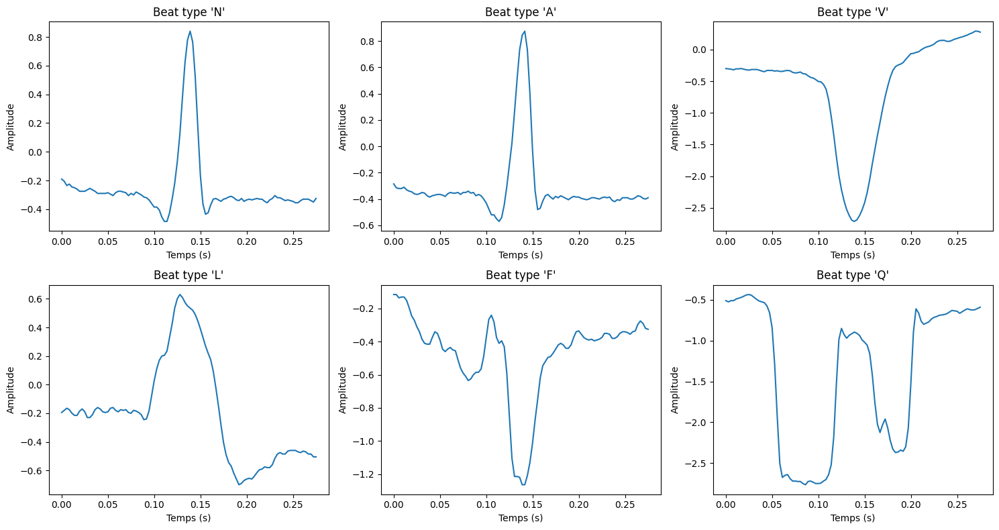

In [ ]:
# Fréquence d'échantillonnage (en Hz)
fs = 360

# Types spécifiques à afficher
types_to_show = ['N', 'A', 'V', 'L', 'F', 'Q']
plt.figure(figsize=(15, 8))

for i, t in enumerate(types_to_show, 1):
    idx = np.where(labels == t)[0][0]  # premier battement de ce type
    t_axis = np.arange(len(beats[idx])) / fs  # conversion des indices en secondes
    plt.subplot(2, 3, i)
    plt.plot(t_axis, beats[idx])
    plt.title(f"Beat type '{t}'")
    plt.xlabel("Temps (s)")
    plt.ylabel("Amplitude")

plt.tight_layout()
plt.show()


# Extraction de features simples
L’objectif de cette étape est de résumer chaque battement cardiaque par des caractéristiques numériques simples, afin de fournir au modèle des informations exploitables pour la classification.

Les signaux ECG bruts contiennent une grande quantité de points et de variations fines, ce qui rend l’apprentissage direct difficile pour un modèle comme le SVM. Les features simples permettent de réduire la dimensionnalité tout en conservant des informations essentielles sur la forme et l’énergie du battement. Elles constituent une première approximation efficace pour distinguer les battements normaux des battements anormaux.

Features extraites

Pour chaque segment de battement, les features suivantes sont calculées :

- **Moyenne (Mean)** : indique le niveau moyen du signal.

- **Écart-type (Std)** : mesure la dispersion des valeurs autour de la moyenne.

- **Valeur minimale (Min)** et **maximale (Max)** : reflètent l’amplitude du battement.

- **Énergie (Energy**) : somme des carrés des amplitudes, représentant la puissance globale du signal

Chaque feature est extraite directement à partir du vecteur de 100 points représentant le battement.

In [ ]:
def extract_simple_features(beat):
    return [
        np.mean(beat),
        np.std(beat),
        np.min(beat),
        np.max(beat),
        np.sum(beat**2)
    ]

simple_beat_features = np.array([extract_simple_features(b) for b in beats])
print("Shape des features obtenus :", simple_beat_features.shape)

# Conversions en Dataframe
columns = ['Mean','Std','Min','Max','Energy']

df_simple_features = pd.DataFrame(simple_beat_features, columns=columns)
df_simple_features['Label'] = labels
df_simple_features

Shape des features obtenus : (112606, 5)


,Mean,Std,Min,Max,Energy,Label
0,-0.24895,0.246365,-0.485,0.840,12.267175,N
1,-0.27345,0.301508,-0.535,0.940,16.568225,N
2,-0.30640,0.280517,-0.570,0.960,17.257100,N
3,-0.32810,0.270488,-0.645,0.860,18.081350,N
4,-0.31960,0.248368,-0.565,0.820,16.383100,N
...,...,...,...,...,...,...
112601,-0.08760,0.468348,-0.365,1.725,22.702400,N
112602,-0.11520,0.474313,-0.410,1.680,23.824400,N
112603,-0.16370,0.440230,-0.430,1.540,22.060050,N
112604,-0.08430,0.470779,-0.350,1.670,22.873950,N


In [ ]:
# Voyons combien de battement compte t-on pour type
df_counts = df_simple_features['Label'].value_counts().reset_index()
df_counts.columns = ['Labels', 'Counts']
print("Decompte des labels bruts :")
df_counts

Decompte des labels bruts :


,Labels,Counts
0,N,75045
1,L,8075
2,R,7259
3,V,7129
4,/,7028
5,A,2546
6,+,1260
7,f,982
8,F,802
9,~,615


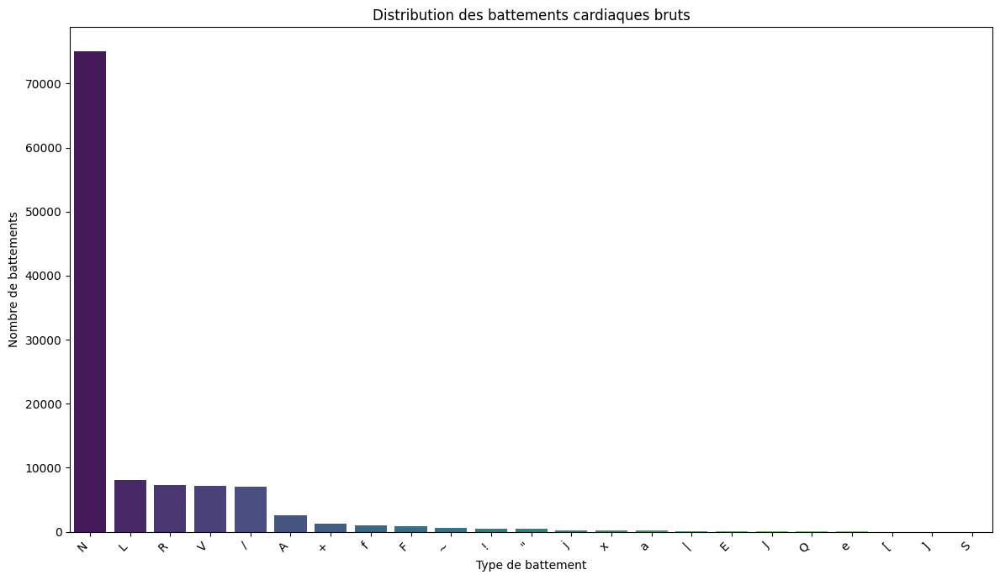

In [ ]:
# les differentes classes de battement
plt.figure(figsize=(12, 7))
sns.barplot(x='Labels', y='Counts', data=df_counts, palette='viridis', hue='Labels', legend=False)
plt.title('Distribution des battements cardiaques bruts')
plt.xlabel('Type de battement')
plt.ylabel('Nombre de battements')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Regroupement simple des types brutes en groupe

Après l’extraction des features simples, il est nécessaire de regrouper les différents types de battements bruts en catégories plus larges afin de simplifier la classification et de gérer le déséquilibre des classes.

Les battements sont regroupés en 3 classes simples :

- **N (Normal)** : battements normaux, simples à identifier et majoritaires dans la base.

- **A (Anomalie)** : regroupe les battements pathologiques ou arythmies importantes comme les extrasystoles ventriculaires (V), atriales (A), fusions (F) et autres formes courantes.

- **T (Autres/Bruit)** : inclut les battements non classifiés ou les artefacts (Q, +, /, |, ~, etc.), qui représentent des anomalies techniques ou des signaux perturbés.

In [ ]:
# # Regroupement en 3 classes simples : N (Normal), A (Anomalie), B (Bruit) (Autres)
labels_array = df_simple_features['Label'].values
simple_group = np.full(labels_array.shape, None)

simple_group[labels_array == 'N'] = 'N'
simple_group[np.isin(labels_array, ['V','A','F','j','f','L','R','E','J','a','e','S'])] = 'A'
simple_group[np.isin(labels_array, ['Q','+','/','|','~','x','!','"','[',']'])] = 'B'

df_simple_features['Group Simple'] = simple_group

# décompte des groupes simples
simple_group_counts = pd.DataFrame(np.unique(simple_group, return_counts=True)).T
simple_group_counts.columns = ['Classe', 'Count']
print("Counts regroupés) :")
simple_group_counts

Counts regroupés) :


,Classe,Count
0,A,27379
1,B,10182
2,N,75045


In [ ]:

plt.figure(figsize=(5, 4))
sns.barplot(x='Classe', y='Count', data=simple_group_counts, palette='viridis', hue='Classe', legend=False)
plt.title('Distribution des battements cardiaques dans le regroupement simple')
plt.xlabel('Type de battement')
plt.ylabel('Nombre de battements')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

NameError: name 'plt' is not defined

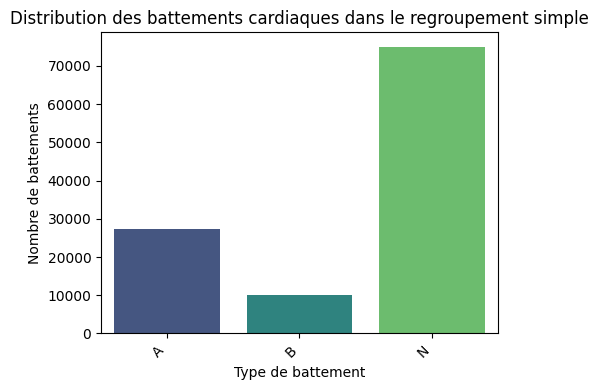

In [ ]:
plt.figure(figsize=(5, 4))
sns.barplot(x='Classe', y='Count', data=simple_group_counts, palette='viridis', hue='Classe', legend=False)
plt.title('Distribution des battements cardiaques dans le regroupement simple')
plt.xlabel('Type de battement')
plt.ylabel('Nombre de battements')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

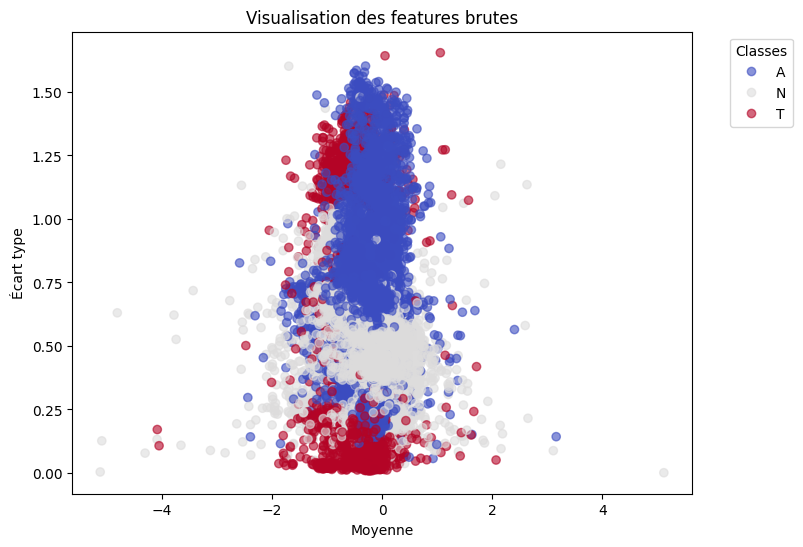

In [ ]:
# # Encodage numérique des classes simples
simple_le = LabelEncoder()
simple_numeric_labels = simple_le.fit_transform(simple_group)

# Visualisation 2D
plt.figure(figsize=(8,6))
scatter = plt.scatter(simple_beat_features[:,0], simple_beat_features[:,1], c=simple_numeric_labels, cmap="coolwarm", alpha=0.6)
plt.xlabel("Moyenne")
plt.ylabel("Écart type")
plt.title("Visualisation des features brutes")

# Légende pour les classes
handles, _ = scatter.legend_elements()
plt.legend(handles, simple_le.classes_, title="Classes", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()


In [ ]:
# # Visualisation 3D
df_features = pd.DataFrame({
    'Moyenne': simple_beat_features[:,0],
    'EcartType': simple_beat_features[:,1],
    'Energie': simple_beat_features[:,2],
    'Label': simple_group
})

fig = px.scatter_3d(
    df_features,
    x='Moyenne',
    y='EcartType',
    z='Energie',
    color='Label',
    opacity=0.8,
    hover_name='Label'
)
fig.update_traces(marker=dict(size=4))
fig.show()

# Classification par SVM sur les features simples (regroupement simple)

Cette section vise à entraîner et évaluer un modèle de **Support Vector Machine (SVM)** en utilisant les **features statistiques simples** extraites des battements cardiaques, selon un regroupement simplifié des classes (par exemple : Normal, Anormal, Bruit).

L’objectif est de mesurer les performances du modèle sur une première configuration avant d’explorer des représentations plus complexes.


**Standardisation** (`StandardScaler`)

Les variables d’entrée peuvent avoir des amplitudes différentes.
La standardisation permet de :

* centrer chaque feature autour de 0,
* réduire sa variance à 1.

**Classifieur SVM** (`SVC`)

* `kernel="rbf"` : permet de capturer des relations non linéaires entre les classes,
* `C=1` : contrôle la pénalisation des erreurs et limite le surapprentissage,
* `gamma="scale"` : ajuste automatiquement l’influence des points

In [ ]:
# %%
# -------------------------------
# Construction du pipeline de classification**
# Le modèle est défini sous forme de **pipeline**,
# combinant une étape de normalisation et un classifieur SVM.
# -------------------------------
svm_model = Pipeline([
    ("scaler", StandardScaler()),
    ("svm", SVC(kernel="rbf", C=1, gamma="scale"))
])

Cette séparation permet de :

* utiliser 80 % des données pour l’entraînement,
* conserver 20 % pour l’évaluation.

Le paramètre `stratify=simple_group` garantit que la proportion des classes est conservée dans les deux ensembles, ce qui est essentiel en présence de classes déséquilibrées.

Le paramètre `random_state=42` assure la reproductibilité des résultats.


In [ ]:
#  Séparation des données (apprentissage / test)**
X_train_simple, X_test_simple, y_train_simple, y_test_simple = train_test_split(
    simple_beat_features,
    simple_group,
    test_size=0.2,
    random_state=42,
    stratify=simple_group
)

In [ ]:
# Entraînement du modèle**
svm_model.fit(X_train_simple, y_train_simple)

Pipeline(steps=[('scaler', StandardScaler()),
                ('svm', SVC(C=1, class_weight='balanced'))])

In [ ]:
# Prédiction sur les données de test**
y_pred_simple = svm_model.predict(X_test_simple)

# Évaluation des performances
**Accuracy**

L’accuracy représente la proportion globale de prédictions correctes :

**Accuracy = Nombre de prédictions correctes / Nombre total d’échantillons**


Elle donne une vue d’ensemble, mais peut être trompeuse en cas de déséquilibre des classes.

**Rapport de classification** (`classification_report`)

Ce rapport fournit, pour chaque classe :

* **Precision** : fiabilité des prédictions,
* **Recall** : capacité à détecter les vrais échantillons,
* **F1-score** : compromis entre précision et rappel,
* **Support** : nombre d’exemples par classe.




In [ ]:
# Évaluation des performances**
print("Accuracy :", accuracy_score(y_test_simple, y_pred_simple))
print(classification_report(y_test_simple, y_pred_simple))


Accuracy : 0.8398898854453424
              precision    recall  f1-score   support

           A       0.74      0.81      0.77      5476
           N       0.96      0.84      0.89     15010
           T       0.56      0.93      0.70      2036

    accuracy                           0.84     22522
   macro avg       0.75      0.86      0.79     22522
weighted avg       0.87      0.84      0.85     22522



# Visualisation avec une matrice de confusion

La matrice de confusion compare les *vraies étiquettes* (`y_test_simple`), c'est-à-dire les catégories réelles des battements cardiaques dans  l'ensemble de test, avec les *étiquettes prédites* par le modèle SVM (`y_pred_simple`).

La matrice obtenue est une table où chaque ligne représente les instances d'une classe réelle, et chaque colonne représente les instances prédites comme appartenant à une classe donnée.

Une cellule `(i, j)` de la matrice indique le nombre d'échantillons qui étaient réellement de la classe `i` mais que le modèle a prédits comme étant de la classe `j`.


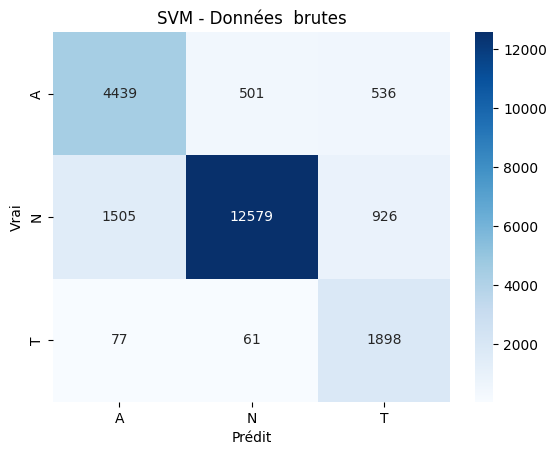

In [ ]:
#
cm = confusion_matrix(y_test_simple, y_pred_simple)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=simple_le.classes_,
            yticklabels=simple_le.classes_)
plt.xlabel("Prédit")
plt.ylabel("Vrai")
plt.title("SVM - Données  brutes")
plt.show()


# Test du modèle sur le regroupement avancé
Evaluons les performances du modèle entraîné sur des features simples avec un regroupement simplifié, lorsqu’il est appliqué à un regroupement avancé, afin d’analyser sa capacité de généralisation face à une classification plus détaillée

**Procédons d'abord à regroupement cliniquement plus significatif des classes**  
**1) Battements normaux**

Le label **N** correspond au rythme sinusal normal, caractéristique d’un cœur sain. Il constitue la classe de référence du modèle.

Groupe : **Normal**

**2) Extrasystoles supraventriculaires**

Ces battements proviennent des oreillettes ou du nœud auriculo-ventriculaire. Ils sont généralement bénins mais indiquent une activité électrique anormale.

Labels concernés : **A, a, J, j, S, e**

Groupe : **Supraventriculaire**

**3) Extrasystoles ventriculaires**

Ces battements sont générés dans les ventricules et sont souvent associés à des troubles cardiaques plus sérieux. Ils représentent une catégorie importante pour le diagnostic.

Labels concernés : **V, E**

Groupe : **Ventriculaire**

**4) Troubles de conduction**

Les battements **L** et **R** correspondent à des blocs de branche gauche ou droite. Ils traduisent un retard de conduction électrique sans être nécessairement une arythmie.

Labels concernés : **L, R**

Groupe : **Bloc de conduction**

**5) Battements de fusion**

Les battements de fusion résultent de la combinaison d’un battement normal et d’un battement pathologique, traduisant une instabilité électrique du cœur.

Labels concernés : **F, f**  
Groupe : **Fusion**

**6) Bruit et annotations techniques**

Certains labels ne correspondent pas à une activité cardiaque réelle, mais à du bruit, des artefacts ou des informations techniques. Ils ne doivent pas être confondus avec des pathologies.

Labels concernés : **Q, +, /, |, ~, x, !, ", [, ]**  
Groupe : **Bruit / Technique**


Ce regroupement permet de **conserver la signification médicale des signaux**, tout en limitant le nombre de classes pour faciliter l’apprentissage automatique.


In [ ]:
# Regroupement avancée des types de battement

labels_array = df_simple_features['Label'].values
advanced_group = np.full(labels_array.shape, None, dtype=object)

# 1) Normal
advanced_group[labels_array == 'N'] = 'Normal'

# 2) Extrasystoles supraventriculaires
advanced_group[np.isin(labels_array, ['A','a','J','j','S','e'])] = 'Supraventriculaire'

# 3) Extrasystoles ventriculaires
advanced_group[np.isin(labels_array, ['V','E'])] = 'Ventriculaire'

# 4) Bloc de conduction
advanced_group[np.isin(labels_array, ['L','R'])] = 'Bloc'

# 5) Battements de fusion
advanced_group[np.isin(labels_array, ['F','f'])] = 'Fusion'

# 6) Bruit / Technique
advanced_group[np.isin(labels_array, ['Q','+','/','|','~','x','!','"','[',']'])] = 'Bruit'




In [ ]:
# décompte des groupes
advanced_group_counts = pd.DataFrame(np.unique(advanced_group, return_counts=True)).T
advanced_group_counts.columns = ['Classe', 'Nombre']
print("Counts regroupés) :")
advanced_group_counts

Counts regroupés) :


,Classe,Nombre
0,Bloc,15334
1,Bruit,10182
2,Fusion,1784
3,Normal,75045
4,Supraventriculaire,3026
5,Ventriculaire,7235


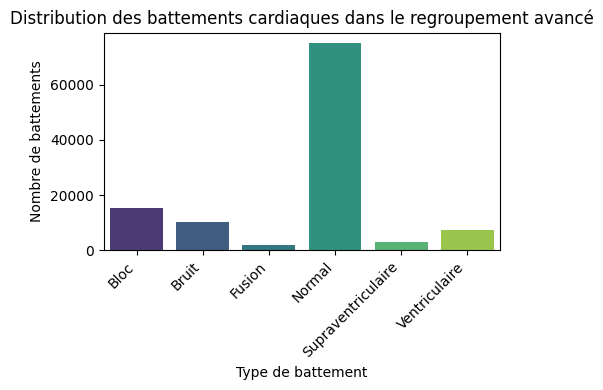

In [ ]:
plt.figure(figsize=(5, 4))
sns.barplot(x='Classe', y='Nombre', data=advanced_group_counts, palette='viridis', hue='Classe', legend=False)
plt.title('Distribution des battements cardiaques dans le regroupement avancé')
plt.xlabel('Type de battement')
plt.ylabel('Nombre de battements')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
# %%
# -------------------------------
# SVM sur features simple avec le regroupement avance
# -------------------------------
svm_model = Pipeline([
    ("scaler", StandardScaler()),
    ("svm", SVC(kernel="rbf", C=1, gamma="scale", class_weight='balanced'))
])

X_train_simple, X_test_simple, y_train_simple, y_test_simple = train_test_split(
    simple_beat_features, advanced_group, test_size=0.2, random_state=42, stratify=simple_group
)

svm_model.fit(X_train_simple, y_train_simple)

y_pred_simple = svm_model.predict(X_test_simple)


print("Accuracy :", accuracy_score(y_test_simple, y_pred_simple))
print(classification_report(y_test_simple, y_pred_simple))

Accuracy : 0.678758547198295
                    precision    recall  f1-score   support

              Bloc       0.68      0.79      0.73      3034
             Bruit       0.59      0.88      0.70      2036
            Fusion       0.10      0.62      0.17       352
            Normal       0.98      0.61      0.75     15010
Supraventriculaire       0.18      0.73      0.28       612
     Ventriculaire       0.69      0.87      0.77      1478

          accuracy                           0.68     22522
         macro avg       0.54      0.75      0.57     22522
      weighted avg       0.85      0.68      0.72     22522



les résultats obtenus montrent que le modèle entraîné sur des features simples et un regroupement simplifié présente des limites importantes en termes de généralisation lorsqu’il est appliqué à un regroupement avancé. Cette incapacité s’explique par le manque d’informations discriminantes dans les features utilisées, qui ne permettent pas de capturer la complexité des différents types de battements cardiaques. Il apparaît ainsi nécessaire d’améliorer le modèle en intégrant des features plus détaillées et représentatives, afin d’augmenter la précision de la classification et de mieux répondre aux exigences d’une analyse médicale fiable.

# Amelioration du modele

Dans cette partie, l’objectif est d’améliorer les performances du modèle en enrichissant la représentation des battements cardiaques. Pour ce faire, en plus des features statistiques vues en haut, nous allons extraire d'autres features plus informatives et plus proches de la réalité physiologique du signal ECG. Contrairement aux features simples, limitées à des statistiques globales, les nouvelles variables intégrées permettent de mieux caractériser la **morphologie**, la dynamique **temporelle** et le contenu **fréquentiel** de chaque battement, éléments essentiels pour distinguer les différents types d’arythmies.

**L’amplitude du pic R** permet de mesurer l’intensité de l’activité électrique ventriculaire.  

**La largeur approximative du complexe QRS** apporte une information sur la conduction électrique du cœur, souvent altérée en cas de bloc ou d’arythmie ventriculaire.

L’analyse fréquentielle, réalisée à l’aide de la transformée de Fourier (FFT), permet d’identifier la **fréquence dominante** du signal ainsi que son **énergie spectrale**, ce qui contribue à différencier les battements normaux des signaux perturbés ou bruités.

**L’entropie**, quant à elle, mesure le degré de désordre du signal et fournit une indication sur sa complexité, les battements pathologiques présentant généralement une structure plus irrégulière que les battements normaux.



In [ ]:
def extract_advanced_features(segment, fs=360):
    """
    Extrait un vecteur de features avancées pour un battement ECG.
    Arguments :
        segment : np.array de taille fixe (100 échantillons) du battement
        fs : fréquence d'échantillonnage en Hz (par défaut 360 Hz)
    Retour :
        features : liste de valeurs scalaires pour ce battement
    """

    # 1) Statistiques simples
    mean_val = np.mean(segment)
    std_val  = np.std(segment)
    min_val  = np.min(segment)
    max_val  = np.max(segment)
    energy   = np.sum(segment**2)

    # 2) Amplitude du pic R et largeur QRS (approximation avec seuil sur max local)
    peaks, _ = find_peaks(segment, height=np.mean(segment)+0.5*np.std(segment))
    r_amp = segment[peaks].max() if len(peaks)>0 else 0
    # Détermination du début et fin du QRS autour du pic R
    qrs_width = 0
    if len(peaks) > 0:
        r_idx = peaks[np.argmax(segment[peaks])]  # index du pic R principal
        threshold = 0.1 * r_amp  # seuil 10% de l'amplitude du R

        # début du QRS
        start = r_idx
        while start > 0 and segment[start] > threshold:
            start -= 1

        # fin du QRS
        end = r_idx
        while end < len(segment) and segment[end] > threshold:
            end += 1

        qrs_width = (end - start) / fs * 1000  # conversion en ms
    # 3) FFT et fréquence dominante
    fft_vals = np.abs(fft(segment))
    dom_f = np.argmax(fft_vals[:len(fft_vals)//2])  # fréquence dominante sur moitié spectre
    fft_energy = np.sum(fft_vals**2)

    # 4) Entropie normalisée
    hist, _ = np.histogram(segment, bins=10, density=True)
    ent = entropy(hist + 1e-6)  # éviter log(0)

    # Regroupement de toutes les features
    features = [
        r_amp, qrs_width,
        dom_f, fft_energy,
        ent,
        mean_val, std_val, min_val, max_val, energy
    ]

    return features


beat_features_advanced = [extract_advanced_features(seg) for seg in beats]
beat_features_advanced = np.array(beat_features_advanced)

# Conversions en Dataframe
columns_advanced = [
    'R_amp','QRS_width',
    'Dom_Freq','FFT_energy',
    'Entropy',
    'Mean','Std','Min','Max','Energy'
]


df_features_advanced = pd.DataFrame(beat_features_advanced, columns=columns_advanced)
# df_features_advanced['Label'] = labels
df_features_advanced['Group Avancé'] = advanced_group

df_features_advanced

,R_amp,QRS_width,Dom_Freq,FFT_energy,Entropy,Mean,Std,Min,Max,Energy,Group Avancé
0,0.840,25.000000,0.0,1226.7175,0.987153,-0.24895,0.246365,-0.485,0.840,12.267175,Normal
1,0.940,27.777778,0.0,1656.8225,1.275469,-0.27345,0.301508,-0.535,0.940,16.568225,Normal
2,0.960,22.222222,0.0,1725.7100,1.113564,-0.30640,0.280517,-0.570,0.960,17.257100,Normal
3,0.860,22.222222,0.0,1808.1350,1.070333,-0.32810,0.270488,-0.645,0.860,18.081350,Normal
4,0.820,22.222222,0.0,1638.3100,0.889034,-0.31960,0.248368,-0.565,0.820,16.383100,Normal
...,...,...,...,...,...,...,...,...,...,...,...
112601,1.725,33.333333,2.0,2270.2400,1.105707,-0.08760,0.468348,-0.365,1.725,22.702400,Normal
112602,1.680,36.111111,2.0,2382.4400,1.152446,-0.11520,0.474313,-0.410,1.680,23.824400,Normal
112603,1.540,33.333333,2.0,2206.0050,1.088058,-0.16370,0.440230,-0.430,1.540,22.060050,Normal
112604,1.670,38.888889,2.0,2287.3950,1.052544,-0.08430,0.470779,-0.350,1.670,22.873950,Normal


Nous allons maintenant reproduire les mêmes étapes qu’auparavant afin de comparer les performances entre le modèle initial et celui enrichi avec les nouvelles features.


In [ ]:
advanced_le = LabelEncoder()
advanced_numeric_labels = advanced_le.fit_transform(advanced_group)

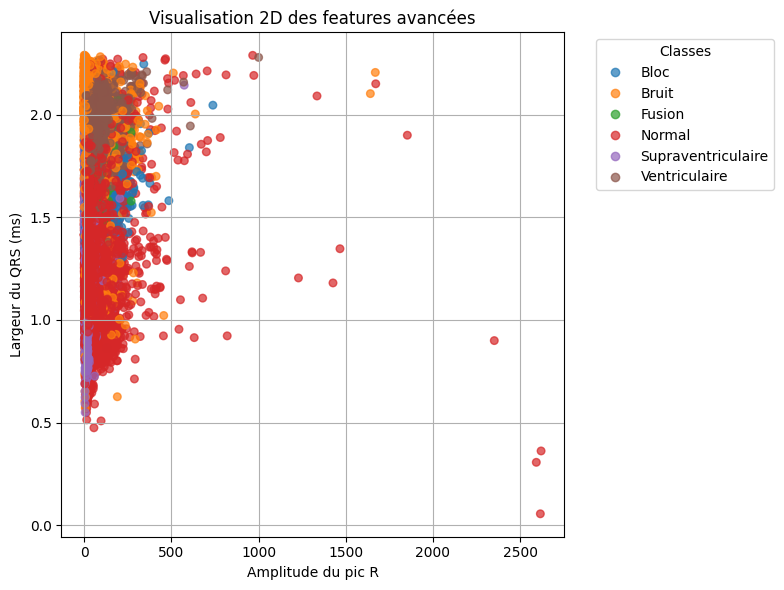

In [ ]:
# Définition d'une palette pour les classes avancées
palette = ListedColormap(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b'])

plt.figure(figsize=(8,6))
scatter = plt.scatter(
    beat_features_advanced[:, 9],   # Entropy
    beat_features_advanced[:, 4],   # Energy
    c=advanced_numeric_labels,
    cmap=palette,
    alpha=0.7,
    s=30
)

plt.xlabel("Amplitude du pic R")
plt.ylabel("Largeur du QRS (ms)")
plt.title("Visualisation 2D des features avancées")
plt.grid(True)

# Légende pour les classes
handles, _ = scatter.legend_elements()
plt.legend(handles, advanced_le.classes_, title="Classes", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [ ]:
# Création d'un DataFrame pour Plotly
df_3d = pd.DataFrame({
    'Energy': beat_features_advanced[:, 9],      # Energy globale
    # 'QRS_width': beat_features_advanced[:, 1],   # QRS en ms
    'FFT_energy': beat_features_advanced[:, 3],
    'Entropy': beat_features_advanced[:, 4],     # Entropie
    'Classe': advanced_group                       # Labels avancés
})

# Visualisation 3D
fig = px.scatter_3d(
    df_3d,
    x='Energy',
    # y='QRS_width',
    y='FFT_energy',
    z='Entropy',
    color='Classe',
    opacity=0.8,
    size_max=6,
    hover_name='Classe',
    color_discrete_sequence=px.colors.qualitative.Bold  # palette dynamique
)

fig.update_traces(marker=dict(size=4))
fig.update_layout(
    title="Visualisation 3D : Energy vs QRS_width vs Entropy",
    scene=dict(
        xaxis_title='Energy',
        yaxis_title='FFT_energy',
        zaxis_title='Entropy'
    )
)

fig.show()

In [ ]:
# %%
# -------------------------------
# 4) SVM sur features brutes avec le regroupement avancé
# -------------------------------
svm_model = Pipeline([
    ("scaler", StandardScaler()),
    ("svm", SVC(kernel="rbf", C=1, gamma="scale", class_weight='balanced'))
])

X_train_advanced, X_test_advanced, y_train_advanced, y_test_advanced = train_test_split(
    beat_features_advanced, advanced_group, test_size=0.2, random_state=42, stratify=advanced_group
)

svm_model.fit(X_train_advanced, y_train_advanced)
y_pred_advanced= svm_model.predict(X_test_advanced)

print("Accuracy :", accuracy_score(y_test_advanced, y_pred_advanced))
print(classification_report(y_test_advanced, y_pred_advanced))

Accuracy : 0.8014829944054702
                    precision    recall  f1-score   support

              Bloc       0.78      0.85      0.81      3067
             Bruit       0.91      0.92      0.92      2036
            Fusion       0.18      0.75      0.29       357
            Normal       0.98      0.77      0.86     15010
Supraventriculaire       0.20      0.74      0.32       605
     Ventriculaire       0.80      0.88      0.84      1447

          accuracy                           0.80     22522
         macro avg       0.64      0.82      0.67     22522
      weighted avg       0.90      0.80      0.84     22522



L’utilisation du paramètre `class_weight='balanced'` a permis de compenser le déséquilibre entre les classes de battements, en donnant plus de poids aux classes minoritaires. Cela aide le modele à mieux apprendre sur toutes les catégories, améliorant ainsi la précision et les scores sur les classes rares.


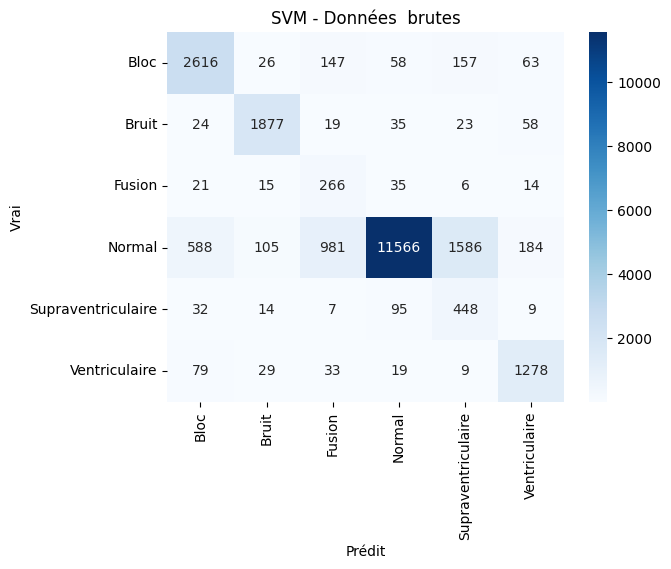

In [ ]:
cm = confusion_matrix(y_test_advanced, y_pred_advanced)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=advanced_le.classes_,
            yticklabels=advanced_le.classes_)
plt.xlabel("Prédit")
plt.ylabel("Vrai")
plt.title("SVM - Données  brutes")
plt.show()


# Conclusion
Ce projet a montré l’importance de l’extraction de features pertinentes pour la classification des battements ECG. Les features simples ont permis une première estimation, mais leur capacité à distinguer les classes détaillées était limitée. L’ajout de features avancées — amplitude R, largeur QRS, FFT et entropie — a enrichi la représentation des battements, tandis que class_weight='balanced' a permis au SVM de mieux apprendre sur les classes rares. Cette combinaison nous a permis d'obtenir un modele dote d'une bonne capacite de generalisation et une bonne precision qui peut etre utlise pour plusieurs applications médicales et pratiques comme:


-    Détection automatique des arythmies et battements anormaux
-   Suivi et surveillance continue du rythme cardiaque.
- Aide au diagnostic précoce de maladies cardiovasculaires.

- Intégration dans des dispositifs médicaux ou wearables (montres connectées, Holter).

- Analyse de grands volumes de signaux ECG en recherche clinique.


Comme perspective, l’utilisation des deux leads ECG permettrait de capturer simultanément l’activité électrique sur deux axes du cœur, offrant une représentation plus complète du signal, ce qui enrichirait les features morphologiques et fréquentielles, améliorerait la détection des arythmies localisées ou complexes, et renforcerait la précision et la robustesse du modèle pour des applications cliniques avancées.
